# Reconstruction basée sur un modèle de déconvolution sphérique robuste et sans biais (rumba-sd)

Ce modèle a été introduit par Canales-Rodriguez et al [CanalesRodriguez2015].

RUMBA-SD utilise des informations a priori sur la fonction de réponse des fibres (diffusivités axiale et perpendiculaire) pour générer un noyau de convolution mettant en correspondance les fODFs sur une sphère avec les données enregistrées. Les fODF sont ensuite estimées à l'aide d'un algorithme itératif d'estimation du maximum de vraisemblance adapté de la déconvolution de Richardson-Lucy (RL) [Richardson1972]. Plus précisément, l'algorithme RL suppose un bruit gaussien, tandis que RUMBA suppose un bruit de Rician/Noncentral Chi, qui reflète plus précisément le bruit généré par les scanners IRM [Constantinides1997]. Cet algorithme contient également un compartiment optionnel pour l'estimation d'une fraction de volume isotrope afin de tenir compte des effets de volume partiel. RUMBA-SD fonctionne avec des données monocoques et multicoques, ainsi qu'avec des données enregistrées dans des systèmes de coordonnées cartésiennes ou sphériques.

Le résultat de RUMBA-SD peut être lissé en appliquant une régularisation spatiale de la variation totale (appelée RUMBA-SD + TV), une technique qui favorise une estimation plus cohérente des fODF dans les voxels voisins [Rudin1992]. Cette capacité de régularisation est également incluse dans cette implémentation.

In [1]:
import numpy as np
from dipy.io.gradients import read_bvals_bvecs
from dipy.core.gradients import gradient_table
from bids.layout import BIDSLayout
import dipy.reconst.dti as dti
from dipy.io.image import load_nifti_data, load_nifti, save_nifti
from dipy.data import get_fnames, get_sphere
from dipy.core.sphere import HemiSphere
from dipy.segment.mask import median_otsu
import dipy.reconst.dti as dti
import nibabel as nib
from dipy.sims.voxel import single_tensor_odf
import numpy as np
import gudhi as gd


In [2]:
gradient_layout = BIDSLayout("./openneuro/ds001907/sub-RC4201/ses-1/", validate=False)

subj = 'RC4201'

dwi_fname = gradient_layout.get(subject=subj, suffix='dwi', extension='.nii.gz', return_type='file')[0]
bvec_fname = gradient_layout.get( extension='.bvec', return_type='file')[0]
bval_fname = gradient_layout.get( extension='.bval', return_type='file')[0]

dwi_img = nib.load(dwi_fname)
affine = dwi_img.affine

bvals, bvecs = read_bvals_bvecs(bval_fname, bvec_fname)
gtab = gradient_table(bvals, bvecs)


#sphere = HemiSphere.from_sphere(get_sphere('repulsion724')) they recommend to use hemisphere for rumba to optimize time
sphere = get_sphere('repulsion724')

In [3]:
dwi_data = dwi_img.get_fdata()

maskdata, mask = median_otsu(dwi_data, vol_idx=range(10, 50), median_radius=3,
                             numpass=1, autocrop=True, dilate=2)
print('maskdata.shape (%d, %d, %d, %d)' % maskdata.shape)
print('data.shape (%d, %d, %d, %d)' % dwi_data.shape)

maskdata.shape (81, 108, 69, 129)
data.shape (128, 128, 72, 129)


Étape 1. Estimation de la fonction de réponse de la fibre

Une approche simple consiste à utiliser les valeurs incluses comme arguments par défaut dans le constructeur de RumbaSDModel. La réponse de la matière blanche, wm_response, a trois valeurs correspondant aux valeurs propres du tenseur (1,7e-3, 0,2e-3, 0,2e-3). Le modèle comporte également des compartiments pour le liquide céphalorachidien (CSF) (csf_response) et la matière grise (GM) (gm_response), dont les diffusivités moyennes sont respectivement fixées à 3,0e-3 et 0,8e-3 [CanalesRodriguez2015]. Ces valeurs par défaut seront souvent adéquates car RUMBA-SD est robuste face à l'imprécision de la réponse impulsionnelle [Dell'Acqua2007]

In [4]:
from dipy.reconst.rumba import RumbaSDModel

rumba = RumbaSDModel(gtab)
print(f"wm_response: {rumba.wm_response}, " +
      f"csf_response: {rumba.csf_response}, " +
      f"gm_response: {rumba.gm_response}")


wm_response: [0.0017 0.0002 0.0002], csf_response: 0.003, gm_response: 0.0008


Nous pouvons visualiser à quoi ressemble cette réponse par défaut.

In [5]:
from fury import window, actor

# Enables/disables interactive visualization
interactive = False

scene = window.Scene()

evals = rumba.wm_response
evecs = np.array([[0, 1, 0], [0, 0, 1], [1, 0, 0]]).T

response_odf = single_tensor_odf(sphere.vertices, evals, evecs)
# Transform our data from 1D to 4D
response_odf = response_odf[None, None, None, :]
response_actor = actor.odf_slicer(response_odf, sphere=sphere
                                  )

scene.add(response_actor)
#print('Saving illustration as default_response.png')
#window.record(scene, out_path='default_response.png', size=(200, 200))


window.show(scene)

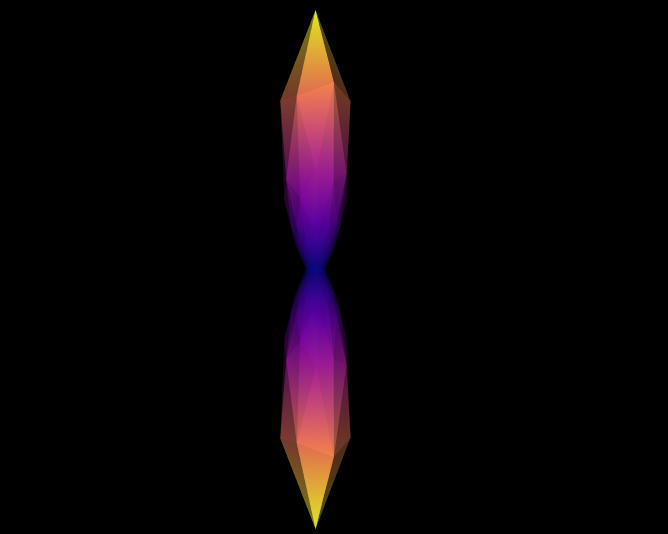

In [7]:
scene.rm(response_actor)

ou par une autre approche : estimation à partir de la région cérébrale locale

In [13]:
from dipy.sims.voxel import single_tensor_odf
from dipy.reconst.csdeconv import auto_response_ssst
from fury import window, actor

response, _ = auto_response_ssst(gtab, dwi_data, roi_radii=10, fa_thr=0.7)
print(response)
evals = response[0]
evecs = np.array([[0, 1, 0], [0, 0, 1], [1, 0, 0]]).T

response_odf = single_tensor_odf(sphere.vertices, evals, evecs)
# transform our data from 1D to 4D
response_odf = response_odf[None, None, None, :]
response_actor = actor.odf_slicer(response_odf, sphere=sphere,

                                 colormap='plasma')
scene = window.Scene()
scene.add(response_actor)
#print('Saving illustration as estimated_response.png')
#window.record(scene, out_path='estimated_response.png', size=(200, 200))
window.show(scene)


(array([0.00165202, 0.00039875, 0.00039875]), 69502.95412529839)


La fonction de réponse estimée :

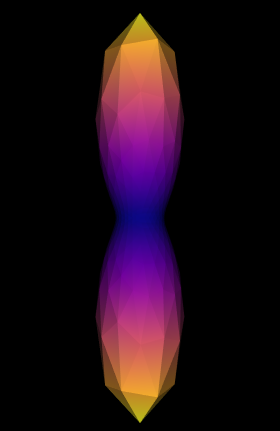

In [9]:
scene.rm(response_actor)

Étape 2. Reconstruction de la fODF

In [5]:
from dipy.reconst.csdeconv import auto_response_ssst

response, _ = auto_response_ssst(gtab, dwi_data, roi_radii=10, fa_thr=0.7)
print(response)

(array([0.00165202, 0.00039875, 0.00039875]), 69502.95412529839)


In [ ]:
evals = response[0]
evecs = np.array([[0, 1, 0], [0, 0, 1], [1, 0, 0]]).T

response_odf = single_tensor_odf(sphere.vertices, evals, evecs)
# transform our data from 1D to 4D
response_odf = response_odf[None, None, None, :]
response_actor = actor.odf_slicer(response_odf, sphere=sphere,
                                  colormap='plasma')
scene.add(response_actor)
print('Saving illustration as estimated_response.png')
window.record(scene, out_path='estimated_response.png', size=(200, 200))
window.show(scene)

Saving illustration as estimated_response.png


In [12]:
scene.rm(response_actor)

J'ai choisi de faire un ajustement global où tous les voxels sont ajustés simultanément au lieu de l'ajustement par voxel:

In [6]:
#global fit
rumba = RumbaSDModel(gtab, wm_response=response[0], gm_response=None,
                     voxelwise=False, use_tv=False, sphere=sphere)
data_tv = dwi_data[20:30, 40:50, 21:22]

vox = dwi_data[29:30,59:60,38:39]

In [7]:
dwi_data.shape

(128, 128, 72, 129)

In [8]:
rumba_fit = rumba.fit(data_tv)

odf = rumba_fit.odf()
print(odf)
odf.shape


[[[[4.87064357e-04 2.38040531e-04 7.63655267e-04 ... 3.90201267e-03
    1.71103950e-03 2.23937093e-05]]

  [[8.97332216e-04 3.06218945e-04 9.73227057e-04 ... 2.39904854e-03
    7.26808238e-05 2.10140552e-07]]

  [[2.15309386e-04 2.80927735e-05 1.09636255e-04 ... 8.00479202e-05
    3.32196415e-04 2.74217540e-07]]

  ...

  [[1.48748778e-03 1.23964171e-03 9.71645106e-04 ... 1.70156006e-04
    2.96861580e-04 7.33293061e-04]]

  [[8.85494414e-04 7.21341544e-04 3.28383006e-04 ... 2.87012195e-04
    6.04456813e-05 4.10850447e-04]]

  [[3.46572068e-03 1.39922376e-03 3.40310589e-03 ... 5.00917082e-04
    1.16003600e-07 1.55409902e-06]]]


 [[[1.58849095e-03 9.57910943e-04 7.43637229e-04 ... 8.10516364e-04
    1.99709353e-03 5.10043436e-04]]

  [[4.28990046e-03 3.15925440e-03 2.55677550e-03 ... 2.17438762e-04
    1.06581357e-03 7.37516811e-04]]

  [[1.44389739e-03 1.27370395e-03 1.17731445e-03 ... 2.73863778e-04
    1.21922520e-04 9.16764073e-04]]

  ...

  [[6.29143909e-03 7.41462146e-03 4.329

(10, 10, 1, 724)

In [10]:
import nibabel as nib

# Get the voxel size from the image header
voxel_size = dwi_img.header.get_zooms()[:3]  # Returns a tuple (voxel_size_x, voxel_size_y, voxel_size_z)
voxel_size

(2.0, 2.0, 2.0)

In [11]:
num_fod_samples = odf.shape[-1]
num_fod_samples

724

In [14]:
import numpy as np
import dipy.reconst.fwdti as fwdti

# Assuming you have already constructed the FOD data using RUMBA-SD


# Get the number of FOD samples per voxel
num_fod_samples = odf.shape[-1]

# Create an array to store the FOD centers
fod_centers = np.zeros(odf.shape[:-1] + (3,))

# Iterate over each voxel
for i in range(odf.shape[0]):
    for j in range(odf.shape[1]):
        for k in range(odf.shape[2]):
            # Get the FOD samples for the current voxel
            fod_samples = odf[i, j, k, :]

            # Compute the center of the FOD samples
            fod_center = np.mean(fod_samples, axis=0)

            # Store the center in the fod_centers array
            fod_centers[i, j, k, :] = fod_center

# Now you have the FOD centers stored in the fod_centers array
# You can use these centers for further analysis or visualization

# Optionally, you can rescale the centers to physical coordinates
scaled_centers = fod_centers * np.array(voxel_size)

# Print the centers for visualization purposes
print(scaled_centers)


[[[[1.93444001e-03 1.93444001e-03 1.93444001e-03]]

  [[1.78345230e-03 1.78345230e-03 1.78345230e-03]]

  [[1.50949868e-03 1.50949868e-03 1.50949868e-03]]

  [[1.96503320e-03 1.96503320e-03 1.96503320e-03]]

  [[2.34881857e-03 2.34881857e-03 2.34881857e-03]]

  [[1.96760683e-03 1.96760683e-03 1.96760683e-03]]

  [[1.71576652e-03 1.71576652e-03 1.71576652e-03]]

  [[1.80687754e-03 1.80687754e-03 1.80687754e-03]]

  [[1.65940142e-03 1.65940142e-03 1.65940142e-03]]

  [[1.44361073e-03 1.44361073e-03 1.44361073e-03]]]


 [[[2.11298919e-03 2.11298919e-03 2.11298919e-03]]

  [[2.45877121e-03 2.45877121e-03 2.45877121e-03]]

  [[2.61419255e-03 2.61419255e-03 2.61419255e-03]]

  [[2.76242951e-03 2.76242951e-03 2.76242951e-03]]

  [[2.52230254e-03 2.52230254e-03 2.52230254e-03]]

  [[1.98920754e-03 1.98920754e-03 1.98920754e-03]]

  [[1.76989155e-03 1.76989155e-03 1.76989155e-03]]

  [[1.75292774e-03 1.75292774e-03 1.75292774e-03]]

  [[1.38672682e-03 1.38672682e-03 1.38672682e-03]]

  [[1.2374

In [19]:
dir(odf)

['T',
 '__abs__',
 '__add__',
 '__and__',
 '__array__',
 '__array_finalize__',
 '__array_function__',
 '__array_interface__',
 '__array_prepare__',
 '__array_priority__',
 '__array_struct__',
 '__array_ufunc__',
 '__array_wrap__',
 '__bool__',
 '__class__',
 '__complex__',
 '__contains__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__divmod__',
 '__doc__',
 '__eq__',
 '__float__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__iand__',
 '__ifloordiv__',
 '__ilshift__',
 '__imatmul__',
 '__imod__',
 '__imul__',
 '__index__',
 '__init__',
 '__init_subclass__',
 '__int__',
 '__invert__',
 '__ior__',
 '__ipow__',
 '__irshift__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__ixor__',
 '__le__',
 '__len__',
 '__lshift__',
 '__lt__',
 '__matmul__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__or__',
 '__pos__',
 '__pow__',
 '__radd__',
 '__rand__',
 '__rdivmod__',
 '__

In [45]:
odf.shape

(1, 1, 1, 724)

In [9]:
combined = rumba_fit.combined_odf_iso

In [10]:
combined.shape

(1, 1, 1, 724)

Pour visualiser les fODF, il est recommandé de combiner le fODF et les composantes isotropes. Cette opération est réalisée à l'aide de la méthode combined_odf_iso de l'objet RumbaFit.

In [11]:
from fury import window, actor

fodf_spheres1 = actor.odf_slicer(combined, sphere=sphere, norm=True,
                                scale=0.5, colormap=None)
scene = window.Scene()
scene.add(fodf_spheres1)
window.show(scene)

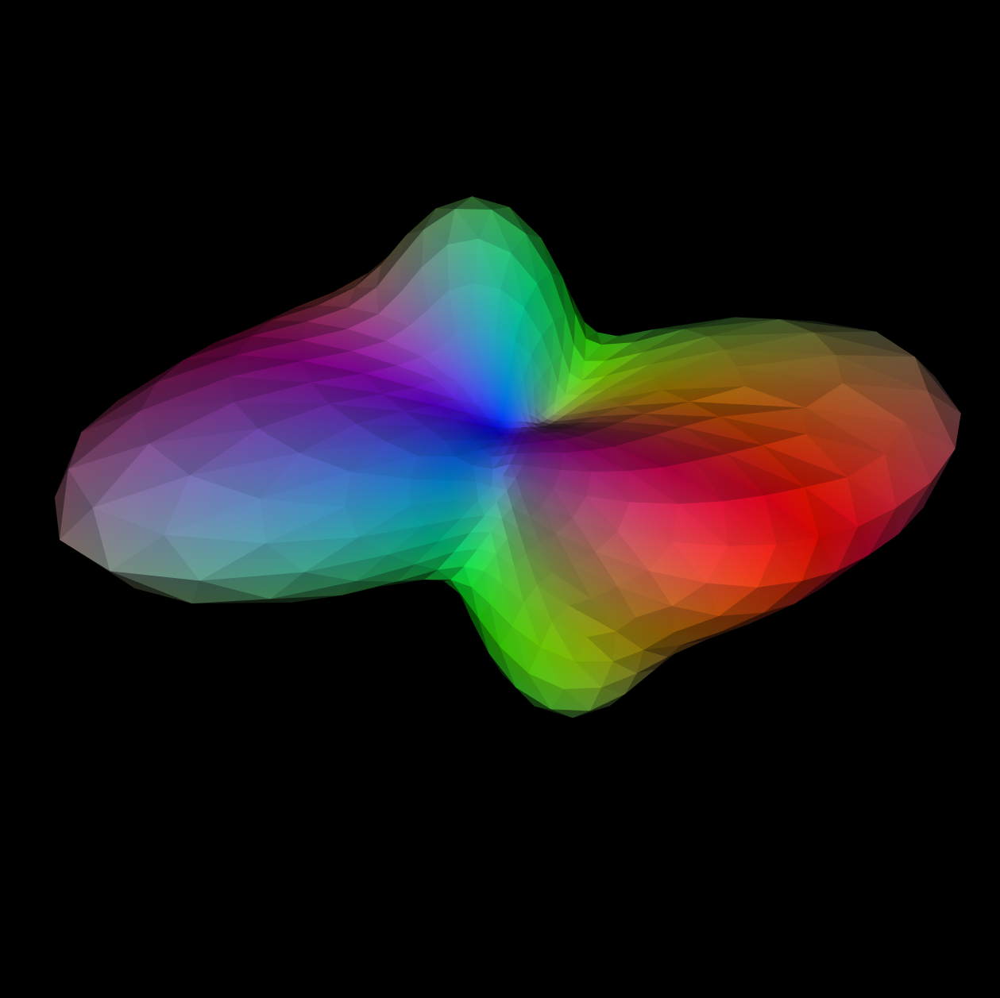

In [23]:
from fury import window, actor
combined = rumba_fit.combined_odf_iso
fodf_spheres2 = actor.odf_slicer(combined[2:3,2:3,:,:], sphere=sphere, norm=False,
                                scale=500, colormap=None)



vertices2 = fodf_spheres2.vertices
faces2 = fodf_spheres2.faces

scene = window.Scene()
actorfor2 = actor.surface(vertices2,faces=faces2)
scene.add(actorfor2)#fodf_spheres2)
scene.add(fodf_spheres2)
window.show(scene)

In [12]:
dwi_data.shape

(128, 128, 72, 129)

In [13]:
from fury import window, actor

fodf_spheres = actor.odf_slicer(odf, sphere=sphere, norm=True,
                                scale=0.5, colormap=None)

scene = window.Scene()
scene.add(fodf_spheres)
window.show(scene)


In [22]:
dir(combined[1:2,1:2,:,:])

['T',
 '__abs__',
 '__add__',
 '__and__',
 '__array__',
 '__array_finalize__',
 '__array_function__',
 '__array_interface__',
 '__array_prepare__',
 '__array_priority__',
 '__array_struct__',
 '__array_ufunc__',
 '__array_wrap__',
 '__bool__',
 '__class__',
 '__complex__',
 '__contains__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__divmod__',
 '__doc__',
 '__eq__',
 '__float__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__iand__',
 '__ifloordiv__',
 '__ilshift__',
 '__imatmul__',
 '__imod__',
 '__imul__',
 '__index__',
 '__init__',
 '__init_subclass__',
 '__int__',
 '__invert__',
 '__ior__',
 '__ipow__',
 '__irshift__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__ixor__',
 '__le__',
 '__len__',
 '__lshift__',
 '__lt__',
 '__matmul__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__or__',
 '__pos__',
 '__pow__',
 '__radd__',
 '__rand__',
 '__rdivmod__',
 '__

In [19]:
dir(fodf_spheres)

['AddConsumer',
 'AddEstimatedRenderTime',
 'AddObserver',
 'AddOrientation',
 'AddPosition',
 'ApplyProperties',
 'B',
 'BreakOnError',
 'BuildPaths',
 'ComputeMatrix',
 'CoordinateSystems',
 'DEVICE',
 'DebugOff',
 'DebugOn',
 'DragableOff',
 'DragableOn',
 'FastDelete',
 'ForceOpaqueOff',
 'ForceOpaqueOn',
 'ForceTranslucentOff',
 'ForceTranslucentOn',
 'GeneralTextureTransform',
 'GeneralTextureUnit',
 'GetActors',
 'GetActors2D',
 'GetAddressAsString',
 'GetAllocatedRenderTime',
 'GetBackfaceProperty',
 'GetBounds',
 'GetCenter',
 'GetClassName',
 'GetCommand',
 'GetConsumer',
 'GetCoordinateSystem',
 'GetCoordinateSystemAsString',
 'GetCoordinateSystemDevice',
 'GetCoordinateSystemRenderer',
 'GetDebug',
 'GetDragable',
 'GetEstimatedRenderTime',
 'GetForceOpaque',
 'GetForceTranslucent',
 'GetGlobalWarningDisplay',
 'GetIsIdentity',
 'GetIsInMemkind',
 'GetLength',
 'GetMTime',
 'GetMapper',
 'GetMatrix',
 'GetModelToWorldMatrix',
 'GetNextPath',
 'GetNumberOfConsumers',
 'GetNu

In [28]:
scene1 = window.Scene()
scene1.add(fodf_spheres)
window.show(scene1)
fodf_spheres.display(1,1,1)

In [43]:
type(fodf_spheres.odfs)

numpy.ndarray

In [44]:
dir(fodf_spheres.odfs)

['T',
 '__abs__',
 '__add__',
 '__and__',
 '__array__',
 '__array_finalize__',
 '__array_function__',
 '__array_interface__',
 '__array_prepare__',
 '__array_priority__',
 '__array_struct__',
 '__array_ufunc__',
 '__array_wrap__',
 '__bool__',
 '__class__',
 '__complex__',
 '__contains__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__divmod__',
 '__doc__',
 '__eq__',
 '__float__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__iand__',
 '__ifloordiv__',
 '__ilshift__',
 '__imatmul__',
 '__imod__',
 '__imul__',
 '__index__',
 '__init__',
 '__init_subclass__',
 '__int__',
 '__invert__',
 '__ior__',
 '__ipow__',
 '__irshift__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__ixor__',
 '__le__',
 '__len__',
 '__lshift__',
 '__lt__',
 '__matmul__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__or__',
 '__pos__',
 '__pow__',
 '__radd__',
 '__rand__',
 '__rdivmod__',
 '__

In [82]:
fodf_spheres.grid_shape

(40, 45, 20)

In [101]:
fodf_spheres.odfs[1,:]

array([0.00136549, 0.00136132, 0.00136075, 0.00137025, 0.00135543,
       0.00136734, 0.00136904, 0.00135932, 0.00137205, 0.00135847,
       0.001365  , 0.00138009, 0.00135407, 0.00137322, 0.0013686 ,
       0.00136626, 0.00137837, 0.00135154, 0.00137295, 0.001382  ,
       0.00136194, 0.00137758, 0.00135686, 0.00137077, 0.00138832,
       0.00135001, 0.00137755, 0.00138367, 0.00137098, 0.00138398,
       0.00134936, 0.00137483, 0.00139282, 0.00135792, 0.00137804,
       0.00136962, 0.00137298, 0.00139254, 0.00134811, 0.00137715,
       0.00139668, 0.00136834, 0.00138156, 0.00135679, 0.00137062,
       0.00139898, 0.00135461, 0.0013811 , 0.00138516, 0.00137769,
       0.00138665, 0.0013497 , 0.00137873, 0.00140508, 0.00136546,
       0.00138099, 0.00137002, 0.00137501, 0.00140008, 0.0013531 ,
       0.00138135, 0.00139966, 0.00137783, 0.00138306, 0.00135814,
       0.00137737, 0.00140711, 0.00136346, 0.00138321, 0.00138529,
       0.00137705, 0.00139256, 0.00134879, 0.00138256, 0.00140

In [106]:
fodf_spheres.indices

(array([ 0,  0,  0, ..., 39, 39, 39]),
 array([ 0,  0,  0, ..., 44, 44, 44]),
 array([ 0,  1,  2, ..., 17, 18, 19]))

Visualisation de la fodf map : RUMBA-SD

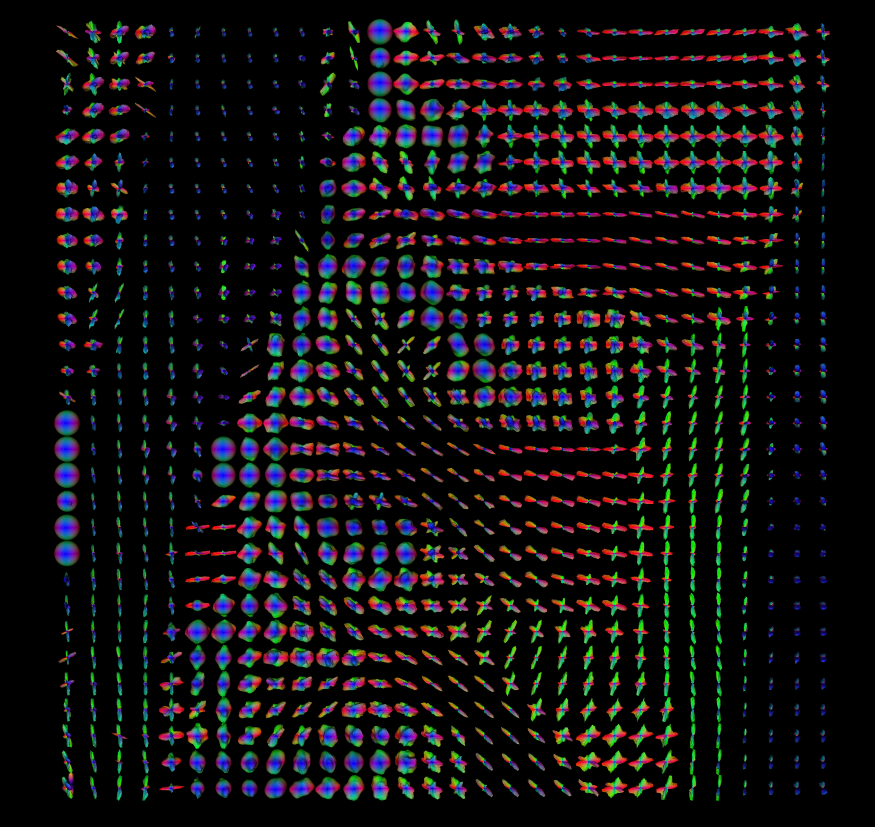

Zoom ++

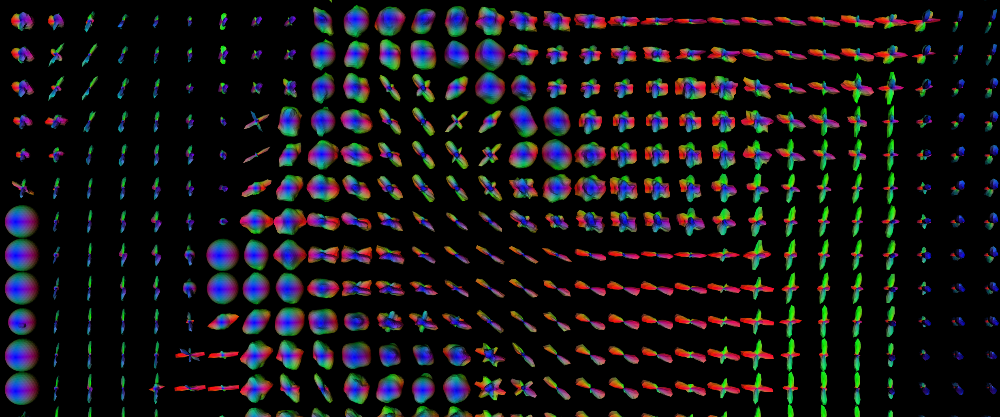

Ce résultat peut être comparé à celui obtenu sans régularisation TV, et l'on peut observer que la cohérence entre voxels voisins est améliorée.

GJK-EPA


In [25]:
fodf_spheres.GetOrigin()

(0.0, 0.0, 0.0)

In [ ]:
#pas executer
import numpy as np

def convexdecomposition(fodf_spheres):
    odfs = fodf_spheres.odfs
    indices = fodf_spheres.indices

    # Iterate over each ODF in fodf_spheres.odfs
    for odf_index in range(len(fodf_spheres.odfs)):
        # Get the indices corresponding to the current ODF
        odf_indices = np.where((odf_index == indices[0]) & (odf_index == indices[1]) & (odf_index == indices[2]))[0]

        # Get the vertices and faces for the current ODF using the obtained indices
        odf_vertices = fodf_spheres.vertices
        odf_faces = fodf_spheres.faces
        center = fodf_spheres.GetCenter()

        # Create tetrahedra list for the current ODF
        tetrahedra_list = []

        # Iterate over each face of the ODF
        for face_indices in odf_faces:
            # Get the three vertices that make up the face
            v1, v2, v3 = odf_vertices[face_indices[0]], odf_vertices[face_indices[1]], odf_vertices[face_indices[2]]

            # Create a list of all four vertices with the center of the ODF
            tetrahedra = [v1, v2, v3, center]

            # Add the tetrahedron to the list
            tetrahedra_list.append(tetrahedra)


    return tetrahedra 


In [45]:
dir(fodf_spheres)

['AddConsumer',
 'AddEstimatedRenderTime',
 'AddObserver',
 'AddOrientation',
 'AddPosition',
 'ApplyProperties',
 'B',
 'BreakOnError',
 'BuildPaths',
 'ComputeMatrix',
 'CoordinateSystems',
 'DEVICE',
 'DebugOff',
 'DebugOn',
 'DragableOff',
 'DragableOn',
 'FastDelete',
 'ForceOpaqueOff',
 'ForceOpaqueOn',
 'ForceTranslucentOff',
 'ForceTranslucentOn',
 'GeneralTextureTransform',
 'GeneralTextureUnit',
 'GetActors',
 'GetActors2D',
 'GetAddressAsString',
 'GetAllocatedRenderTime',
 'GetBackfaceProperty',
 'GetBounds',
 'GetCenter',
 'GetClassName',
 'GetCommand',
 'GetConsumer',
 'GetCoordinateSystem',
 'GetCoordinateSystemAsString',
 'GetCoordinateSystemDevice',
 'GetCoordinateSystemRenderer',
 'GetDebug',
 'GetDragable',
 'GetEstimatedRenderTime',
 'GetForceOpaque',
 'GetForceTranslucent',
 'GetGlobalWarningDisplay',
 'GetIsIdentity',
 'GetIsInMemkind',
 'GetLength',
 'GetMTime',
 'GetMapper',
 'GetMatrix',
 'GetModelToWorldMatrix',
 'GetNextPath',
 'GetNumberOfConsumers',
 'GetNu

In [ ]:
fodf_spheres.GetCenter()

In [47]:
fodf_spheres._get_all_faces(2,3)

array([[  2, 363,   0],
       [  0, 363, 365],
       [366, 364,   1],
       ...,
       [726, 709, 692],
       [726, 722, 688],
       [705, 722, 726]])

In [67]:
fodf_spheres.faces[1,]

array([0, 1, 3], dtype=uint16)

In [23]:
fodf_spheres.faces

array([[  2, 363,   0],
       [  0, 363, 365],
       [366, 364,   1],
       ...,
       [723, 706, 689],
       [723, 719, 685],
       [702, 719, 723]], dtype=uint16)

In [48]:
fodf_spheres.indices

(array([ 0,  0,  0, ..., 39, 39, 39]),
 array([ 0,  0,  0, ..., 44, 44, 44]),
 array([ 0,  1,  2, ..., 17, 18, 19]))

In [15]:
dir(fodf_spheres)

['AddConsumer',
 'AddEstimatedRenderTime',
 'AddObserver',
 'AddOrientation',
 'AddPosition',
 'ApplyProperties',
 'B',
 'BreakOnError',
 'BuildPaths',
 'ComputeMatrix',
 'CoordinateSystems',
 'DEVICE',
 'DebugOff',
 'DebugOn',
 'DragableOff',
 'DragableOn',
 'FastDelete',
 'ForceOpaqueOff',
 'ForceOpaqueOn',
 'ForceTranslucentOff',
 'ForceTranslucentOn',
 'GeneralTextureTransform',
 'GeneralTextureUnit',
 'GetActors',
 'GetActors2D',
 'GetAddressAsString',
 'GetAllocatedRenderTime',
 'GetBackfaceProperty',
 'GetBounds',
 'GetCenter',
 'GetClassName',
 'GetCommand',
 'GetConsumer',
 'GetCoordinateSystem',
 'GetCoordinateSystemAsString',
 'GetCoordinateSystemDevice',
 'GetCoordinateSystemRenderer',
 'GetDebug',
 'GetDragable',
 'GetEstimatedRenderTime',
 'GetForceOpaque',
 'GetForceTranslucent',
 'GetGlobalWarningDisplay',
 'GetIsIdentity',
 'GetIsInMemkind',
 'GetLength',
 'GetMTime',
 'GetMapper',
 'GetMatrix',
 'GetModelToWorldMatrix',
 'GetNextPath',
 'GetNumberOfConsumers',
 'GetNu

In [34]:
fodf_spheres.faces.shape

# Slice All Odfs into singular Objects First?
# --- For now use the one sperated above

# Create Tetrahedra from Triangle Mesh
# This is only for one Singular Object.
faces = fodf_spheres.faces
print(faces.shape)
vertices = fodf_spheres.vertices 
x1, x2, y1, y2, z1, z2 = fodf_spheres.GetBounds()
center = fodf_spheres.GetPosition()
tetrahedra_list = []
for face in faces:
    # Get the three vertices that make up the face
    v1, v2, v3 = vertices[face[0]], vertices[face[1]], vertices[face[2]]
    # Create a list of all four vertices with the center of the ODF
    center = np.array(center)
    tetrahedra = [v1, v2, v3, center]
    # newFaces = Vertex index -> create 3 new faces 
    # Add the tetrahedron to the list
    tetrahedra_list.append(tetrahedra)
tetrahedra_list

(1444, 3)


[[array([0.00657908, 0.99435208, 0.10592761]),
  array([ 0.03198756,  0.99848131, -0.04485394]),
  array([-0.0914682 ,  0.99569081,  0.01527661]),
  array([0., 0., 0.])],
 [array([-0.0914682 ,  0.99569081,  0.01527661]),
  array([ 0.03198756,  0.99848131, -0.04485394]),
  array([-0.0839107 ,  0.98826411, -0.12764421]),
  array([0., 0., 0.])],
 [array([-0.13242686, -0.99000031, -0.04860558]),
  array([-0.00657908, -0.99435208, -0.10592761]),
  array([-0.03198756, -0.99848131,  0.04485394]),
  array([0., 0., 0.])],
 [array([-0.14108988,  0.98088527,  0.13400647]),
  array([0.00657908, 0.99435208, 0.10592761]),
  array([-0.0914682 ,  0.99569081,  0.01527661]),
  array([0., 0., 0.])],
 [array([-0.03198756, -0.99848131,  0.04485394]),
  array([ 0.0839107 , -0.98826411,  0.12764421]),
  array([-0.03755059, -0.98096356,  0.19052675]),
  array([0., 0., 0.])],
 [array([0.10475293, 0.97474003, 0.19725286]),
  array([0.13242686, 0.99000031, 0.04860558]),
  array([0.00657908, 0.99435208, 0.1059276

In [38]:
faces

array([[  2, 363,   0],
       [  0, 363, 365],
       [366, 364,   1],
       ...,
       [723, 706, 689],
       [723, 719, 685],
       [702, 719, 723]], dtype=uint16)

In [36]:
odf.shape

(724,)

In [17]:
fodf_spheres.odfs.shape

(4, 724)

In [32]:
print(center)
print(tetrahedra_list)

(-1.0842021724855044e-19, 0.0, 6.0)
[[array([0.00657908, 0.99435208, 0.10592761]), array([ 0.03198756,  0.99848131, -0.04485394]), array([-0.0914682 ,  0.99569081,  0.01527661]), (-1.0842021724855044e-19, 0.0, 6.0)], [array([-0.0914682 ,  0.99569081,  0.01527661]), array([ 0.03198756,  0.99848131, -0.04485394]), array([-0.0839107 ,  0.98826411, -0.12764421]), (-1.0842021724855044e-19, 0.0, 6.0)], [array([-0.13242686, -0.99000031, -0.04860558]), array([-0.00657908, -0.99435208, -0.10592761]), array([-0.03198756, -0.99848131,  0.04485394]), (-1.0842021724855044e-19, 0.0, 6.0)], [array([-0.14108988,  0.98088527,  0.13400647]), array([0.00657908, 0.99435208, 0.10592761]), array([-0.0914682 ,  0.99569081,  0.01527661]), (-1.0842021724855044e-19, 0.0, 6.0)], [array([-0.03198756, -0.99848131,  0.04485394]), array([ 0.0839107 , -0.98826411,  0.12764421]), array([-0.03755059, -0.98096356,  0.19052675]), (-1.0842021724855044e-19, 0.0, 6.0)], [array([0.10475293, 0.97474003, 0.19725286]), array([0

In [23]:
import numpy as np
from scipy.spatial import ConvexHull

# Convert the odfs array to a NumPy array
odfs = np.array(fodf_spheres.odfs)

convex_hulls = []
for odf in odfs:
    # Find the indices of non-zero elements in the current ODF
    odf_indices = np.where(odf > 0)[0]

    # Get the coordinates of the vertices for the current ODF
    odf_vertices = fodf_spheres.vertices[odf_indices]

    # Create a ConvexHull object from the ODF vertices
    hull = ConvexHull(odf_vertices)

    # Get the convex hull vertices
    convex_hull_vertices = odf_vertices[hull.vertices]

    # Append the convex hull vertices to the list
    convex_hulls.append(convex_hull_vertices)
convex_hulls
convex_hulls[1]

array([[-0.0914682 ,  0.99569081,  0.01527661],
       [-0.03198756, -0.99848131,  0.04485394],
       [ 0.00657908,  0.99435208,  0.10592761],
       ...,
       [-0.73806889,  0.044762  , -0.67323894],
       [ 0.99918788,  0.03855745, -0.01170055],
       [ 0.71569262, -0.0094363 , -0.69835165]])

In [81]:
convex_hulls[1]

array([[-0.0914682 ,  0.99569081,  0.01527661],
       [-0.03198756, -0.99848131,  0.04485394],
       [ 0.00657908,  0.99435208,  0.10592761],
       ...,
       [-0.73806889,  0.044762  , -0.67323894],
       [ 0.99918788,  0.03855745, -0.01170055],
       [ 0.71569262, -0.0094363 , -0.69835165]])

In [24]:
dir(odf)

['T',
 '__abs__',
 '__add__',
 '__and__',
 '__array__',
 '__array_finalize__',
 '__array_function__',
 '__array_interface__',
 '__array_prepare__',
 '__array_priority__',
 '__array_struct__',
 '__array_ufunc__',
 '__array_wrap__',
 '__bool__',
 '__class__',
 '__complex__',
 '__contains__',
 '__copy__',
 '__deepcopy__',
 '__delattr__',
 '__delitem__',
 '__dir__',
 '__divmod__',
 '__doc__',
 '__eq__',
 '__float__',
 '__floordiv__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__getitem__',
 '__gt__',
 '__hash__',
 '__iadd__',
 '__iand__',
 '__ifloordiv__',
 '__ilshift__',
 '__imatmul__',
 '__imod__',
 '__imul__',
 '__index__',
 '__init__',
 '__init_subclass__',
 '__int__',
 '__invert__',
 '__ior__',
 '__ipow__',
 '__irshift__',
 '__isub__',
 '__iter__',
 '__itruediv__',
 '__ixor__',
 '__le__',
 '__len__',
 '__lshift__',
 '__lt__',
 '__matmul__',
 '__mod__',
 '__mul__',
 '__ne__',
 '__neg__',
 '__new__',
 '__or__',
 '__pos__',
 '__pow__',
 '__radd__',
 '__rand__',
 '__rdivmod__',
 '__

In [31]:
fodf_spheres.GetPosition()

(0.0, 0.0, 0.0)

In [ ]:
import numpy as np
from scipy.spatial.distance import cdist

# Determine the expansion factor
x = 1.0

num_odfs = len(convex_hulls)

# Iterate over each pair of convex hulls
for i in range(num_odfs):
    for j in range(i + 1, num_odfs):
        hull_i = convex_hulls[i]
        hull_j = convex_hulls[j]

        # Get the coordinates of the vertices for hull_i and hull_j
        points_i = hull_i
        points_j = hull_j

        # Perform GJK algorithm to find closest points
        closest_points = cdist(points_i, points_j).min(axis=1)

        # Check distance against expansion factor
        if closest_points.min() < x:
            # Penetration
            print(f"ODF {i} and ODF {j} are penetrating.")
        elif closest_points.min() == x:
            # Contact
            print(f"ODF {i} and ODF {j} are in contact.")
        else:
            # Expansion
            print(f"ODF {i} and ODF {j} are expanding.")



ODF 0 and ODF 1 are penetrating.
ODF 0 and ODF 2 are penetrating.
ODF 0 and ODF 3 are penetrating.
ODF 0 and ODF 4 are penetrating.
ODF 0 and ODF 5 are penetrating.
ODF 0 and ODF 6 are penetrating.
ODF 0 and ODF 7 are penetrating.
ODF 0 and ODF 8 are penetrating.
ODF 0 and ODF 9 are penetrating.
ODF 0 and ODF 10 are penetrating.
ODF 0 and ODF 11 are penetrating.
ODF 0 and ODF 12 are penetrating.
ODF 0 and ODF 13 are penetrating.
ODF 0 and ODF 14 are penetrating.
ODF 0 and ODF 15 are penetrating.
ODF 0 and ODF 16 are penetrating.
ODF 0 and ODF 17 are penetrating.
ODF 0 and ODF 18 are penetrating.
ODF 0 and ODF 19 are penetrating.
ODF 0 and ODF 20 are penetrating.
ODF 0 and ODF 21 are penetrating.
ODF 0 and ODF 22 are penetrating.
ODF 0 and ODF 23 are penetrating.
ODF 0 and ODF 24 are penetrating.
ODF 0 and ODF 25 are penetrating.
ODF 0 and ODF 26 are penetrating.
ODF 0 and ODF 27 are penetrating.
ODF 0 and ODF 28 are penetrating.
ODF 0 and ODF 29 are penetrating.
ODF 0 and ODF 30 are pe

In [29]:
import numpy as np
from scipy.spatial.distance import cdist

num_odfs = len(convex_hulls)

growth_distances = []

# Iterate over each pair of convex hulls
for i in range(num_odfs):
    for j in range(i + 1, num_odfs):
        hull_i = convex_hulls[i]
        hull_j = convex_hulls[j]

        # Get the coordinates of the vertices for hull_i and hull_j
        points_i = hull_i
        points_j = hull_j

        # Perform GJK algorithm to find closest points
        closest_points = cdist(points_i, points_j).min(axis=1)

        # Compute the growth distance as the minimum distance between closest points
        growth_distance = closest_points.min()

        # Store the growth distance
        growth_distances.append(growth_distance)

# Find the smallest factor of expansion (growth distance) for each ODF
smallest_expansions = [min(growth_distances[i:i+num_odfs-1]) for i in range(num_odfs)]

# Print the smallest factor of expansion for each ODF
for i, expansion in enumerate(smallest_expansions):
    print(f"ODF {i} smallest factor of expansion: {expansion}")


ODF 0 smallest factor of expansion: 0.0
ODF 1 smallest factor of expansion: 0.0
ODF 2 smallest factor of expansion: 0.0
ODF 3 smallest factor of expansion: 0.0
ODF 4 smallest factor of expansion: 0.0
ODF 5 smallest factor of expansion: 0.0
ODF 6 smallest factor of expansion: 0.0
ODF 7 smallest factor of expansion: 0.0
ODF 8 smallest factor of expansion: 0.0
ODF 9 smallest factor of expansion: 0.0
ODF 10 smallest factor of expansion: 0.0
ODF 11 smallest factor of expansion: 0.0
ODF 12 smallest factor of expansion: 0.0
ODF 13 smallest factor of expansion: 0.0
ODF 14 smallest factor of expansion: 0.0
ODF 15 smallest factor of expansion: 0.0
ODF 16 smallest factor of expansion: 0.0
ODF 17 smallest factor of expansion: 0.0
ODF 18 smallest factor of expansion: 0.0
ODF 19 smallest factor of expansion: 0.0
ODF 20 smallest factor of expansion: 0.0
ODF 21 smallest factor of expansion: 0.0
ODF 22 smallest factor of expansion: 0.0
ODF 23 smallest factor of expansion: 0.0
ODF 24 smallest factor of 

In [30]:
import numpy as np
from scipy.spatial.distance import cdist


num_odfs = len(convex_hulls)

expansion_factors = []

# Iterate over each pair of convex hulls
for i in range(num_odfs):
    for j in range(i + 1, num_odfs):
        hull_i = convex_hulls[i]
        hull_j = convex_hulls[j]

        # Get the coordinates of the vertices for hull_i and hull_j
        points_i = hull_i
        points_j = hull_j

        # Perform GJK algorithm to find closest points
        closest_points = cdist(points_i, points_j).min(axis=1)

        # Compute the expansion factor as the maximum distance among closest points
        expansion_factor = closest_points.max()

        # Store the expansion factor
        expansion_factors.append(expansion_factor)

# Find the smallest expansion factor for each ODF
smallest_expansion_factors = [min(expansion_factors[i:i+num_odfs-1]) for i in range(num_odfs)]

# Print the smallest expansion factor for each ODF
for i, factor in enumerate(smallest_expansion_factors):
    print(f"ODF {i} smallest expansion factor: {factor}")


ODF 0 smallest expansion factor: 0.0
ODF 1 smallest expansion factor: 0.0
ODF 2 smallest expansion factor: 0.0
ODF 3 smallest expansion factor: 0.0
ODF 4 smallest expansion factor: 0.0
ODF 5 smallest expansion factor: 0.0
ODF 6 smallest expansion factor: 0.0
ODF 7 smallest expansion factor: 0.0
ODF 8 smallest expansion factor: 0.0
ODF 9 smallest expansion factor: 0.0
ODF 10 smallest expansion factor: 0.0
ODF 11 smallest expansion factor: 0.0
ODF 12 smallest expansion factor: 0.0
ODF 13 smallest expansion factor: 0.0
ODF 14 smallest expansion factor: 0.0
ODF 15 smallest expansion factor: 0.0
ODF 16 smallest expansion factor: 0.0
ODF 17 smallest expansion factor: 0.0
ODF 18 smallest expansion factor: 0.0
ODF 19 smallest expansion factor: 0.0
ODF 20 smallest expansion factor: 0.0
ODF 21 smallest expansion factor: 0.0
ODF 22 smallest expansion factor: 0.0
ODF 23 smallest expansion factor: 0.0
ODF 24 smallest expansion factor: 0.0
ODF 25 smallest expansion factor: 0.0
ODF 26 smallest expans